In [12]:
# Install required libraries if not present
!pip install pandas numpy matplotlib seaborn plotly

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configuration
LOG_FILE = "../data/simulation_log.csv"

# Model Weights (From C++ DecisionEngine.cpp)
W_IMBALANCE = 5.066873550415039
W_SPREAD = -0.04096340388059616
BIAS = 0.03044874034821987

## 1. Load & Preprocess Data

In [14]:
def load_data(filepath):
    # Read CSV generated by C++ Engine
    # Format: TICK,timestamp,imbalance,spread,microprice,midprice,inventory,equity
    try:
        df = pd.read_csv(filepath, names=["Type", "timestamp", "imbalance", "spread", "microprice", "midprice", "inventory", "equity"])
        df = df[df["Type"] == "TICK"].copy()
        
        # Filter out invalid timestamps (e.g. overflowed values)
        # Valid range for ns: roughly 1970 to 2262
        # 2024 in ns is ~1.7e18
        # 2200 in ns is ~7.2e18
        # We filter anything > 4e18 (approx year 2096) or < 0
        valid_mask = (df['timestamp'] > 0) & (df['timestamp'] < 4e18)
        if (~valid_mask).any():
            print(f"Warning: Dropping { (~valid_mask).sum() } rows with invalid timestamps (overflow).")
            df = df[valid_mask]

        # Convert timestamp to datetime (assuming ns)
        df['datetime'] = pd.to_datetime(df['timestamp'], unit='ns')
        
        # Calculate derived metrics
        df['midprice_change'] = df['midprice'].diff()
        df['is_up'] = (df['midprice_change'] > 0).astype(int)
        
        return df
    except FileNotFoundError:
        print(f"Error: File {filepath} not found. Please run the simulation first.")
        return pd.DataFrame()

df = load_data(LOG_FILE)
print(f"Loaded {len(df)} events.")
df.head()

Loaded 50000 events.


,Type,timestamp,imbalance,spread,microprice,midprice,inventory,equity,datetime,midprice_change,is_up
4,TICK,1.761955e+18,-1.000000,0.00,0.0,0.0,0.00,0.000000,2025-11-01 00:00:00.098000896,NaN,0
5,TICK,1.761955e+18,0.141631,0.01,109608.0,109608.0,0.00,0.000000,2025-11-01 00:00:00.205412096,109608.0,1
6,TICK,1.761955e+18,-0.303665,0.01,109608.0,109608.0,-0.01,0.438382,2025-11-01 00:00:00.276953088,0.0,0
7,TICK,1.761955e+18,-0.349633,0.01,109608.0,109608.0,-0.02,0.876764,2025-11-01 00:00:00.308023040,0.0,0
8,TICK,1.761955e+18,-0.330120,0.01,109608.0,109608.0,-0.03,1.315150,2025-11-01 00:00:00.330718976,0.0,0


## 2. Feature Attribution
Since we are using a Logistic Regression model, we can calculate the direct contribution of each feature to the log-odds score.

$$ Score = w_{imbalance} \cdot x_{imbalance} + w_{spread} \cdot x_{spread} + bias $$

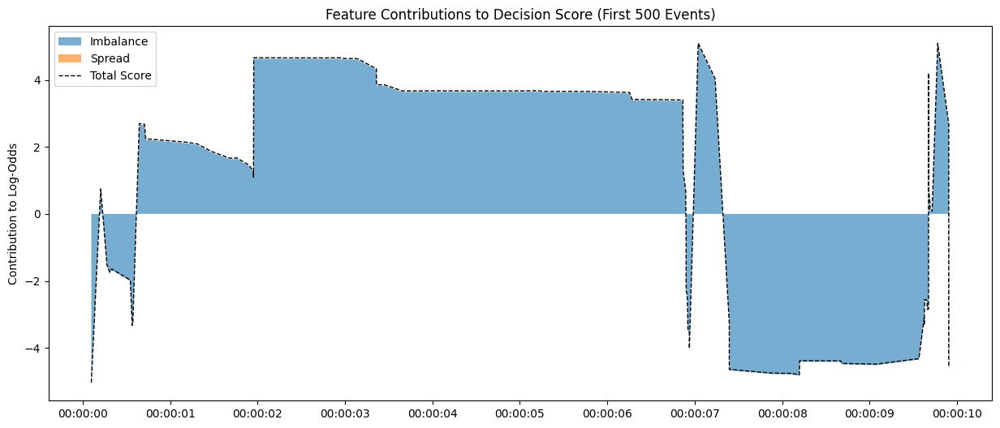

In [15]:
if not df.empty:
    # Calculate contributions
    df['contrib_imbalance'] = df['imbalance'] * W_IMBALANCE
    df['contrib_spread'] = df['spread'] * W_SPREAD
    df['score'] = df['contrib_imbalance'] + df['contrib_spread'] + BIAS
    df['probability'] = 1.0 / (1.0 + np.exp(-df['score']))

    # Visualization: Feature Contributions over time (Subset)
    subset = df.iloc[:500] # First 500 events for clarity
    
    fig, ax = plt.subplots(figsize=(15, 6))
    ax.stackplot(subset['datetime'], 
                 subset['contrib_imbalance'], 
                 subset['contrib_spread'], 
                 labels=['Imbalance', 'Spread'],
                 alpha=0.6)
    ax.plot(subset['datetime'], subset['score'], color='black', linewidth=1, label='Total Score', linestyle='--')
    ax.set_title('Feature Contributions to Decision Score (First 500 Events)')
    ax.set_ylabel('Contribution to Log-Odds')
    ax.legend(loc='upper left')
    plt.show()

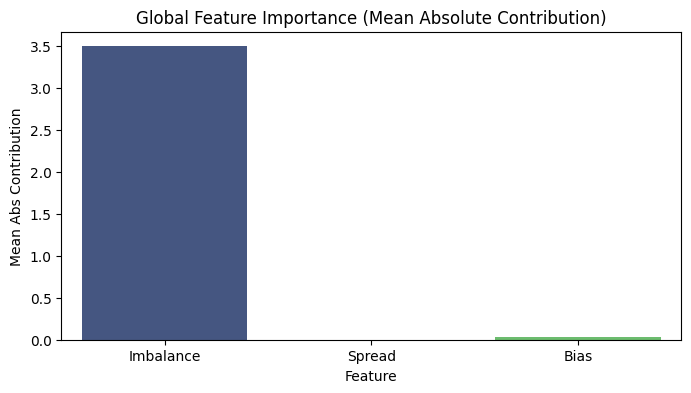

In [16]:
if not df.empty:
    # Average Absolute Contribution
    mean_abs_contrib = pd.DataFrame({
        'Feature': ['Imbalance', 'Spread', 'Bias'],
        'Mean Abs Contribution': [
            df['contrib_imbalance'].abs().mean(),
            df['contrib_spread'].abs().mean(),
            abs(BIAS)
        ]
    })
    
    plt.figure(figsize=(8, 4))
    # Fix seaborn FutureWarning
    sns.barplot(data=mean_abs_contrib, x='Feature', y='Mean Abs Contribution', hue='Feature', palette='viridis', legend=False)
    plt.title('Global Feature Importance (Mean Absolute Contribution)')
    plt.show()

## 3. PnL & Inventory Analysis
Analyze how the strategy's inventory management affects profitability.

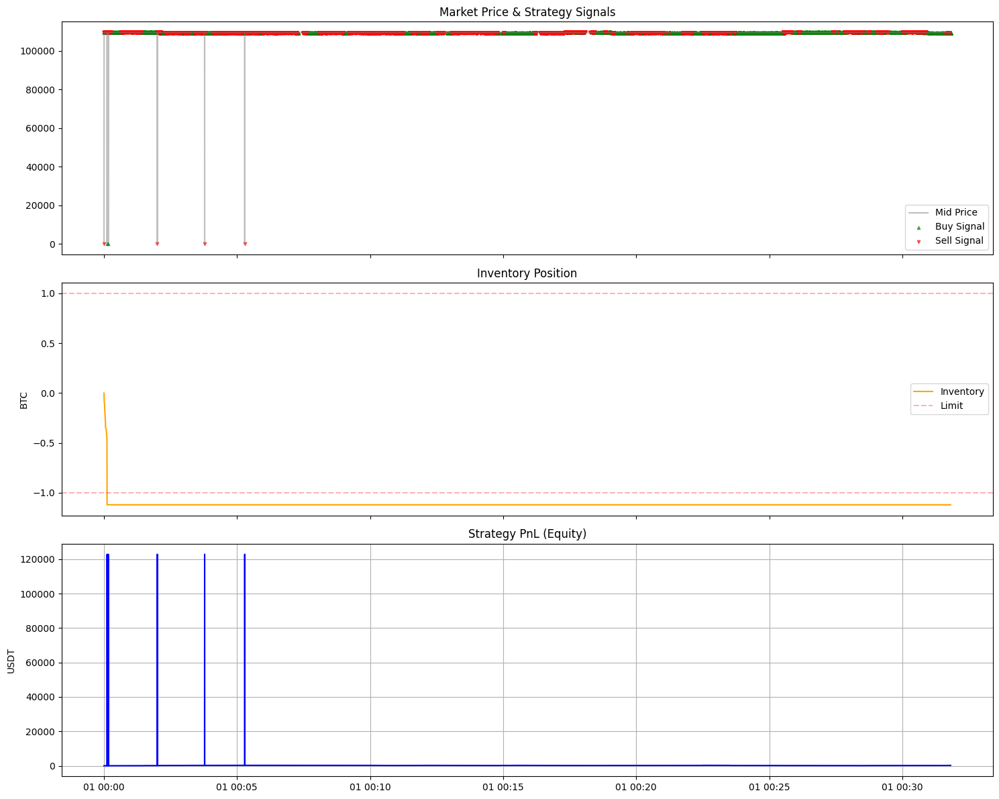

In [17]:
if not df.empty:
    fig, axes = plt.subplots(3, 1, figsize=(15, 12), sharex=True)
    
    # 1. Price & Decisions
    axes[0].plot(df['datetime'], df['midprice'], label='Mid Price', color='gray', alpha=0.5)
    # Highlight Buy/Sell signals based on probability
    buys = df[df['probability'] > 0.6]
    sells = df[df['probability'] < 0.4]
    axes[0].scatter(buys['datetime'], buys['midprice'], color='green', marker='^', s=10, label='Buy Signal', alpha=0.6)
    axes[0].scatter(sells['datetime'], sells['midprice'], color='red', marker='v', s=10, label='Sell Signal', alpha=0.6)
    axes[0].set_title('Market Price & Strategy Signals')
    axes[0].legend()
    
    # 2. Inventory
    axes[1].plot(df['datetime'], df['inventory'], color='orange', label='Inventory')
    axes[1].axhline(y=1.0, color='r', linestyle='--', alpha=0.3, label='Limit')
    axes[1].axhline(y=-1.0, color='r', linestyle='--', alpha=0.3)
    axes[1].set_title('Inventory Position')
    axes[1].set_ylabel('BTC')
    axes[1].legend()
    
    # 3. PnL (Equity)
    axes[2].plot(df['datetime'], df['equity'], color='blue', label='Total Equity')
    axes[2].set_title('Strategy PnL (Equity)')
    axes[2].set_ylabel('USDT')
    axes[2].grid(True)
    
    plt.tight_layout()
    plt.show()

## 4. Prediction vs Outcome
Does the model actually predict price movements?

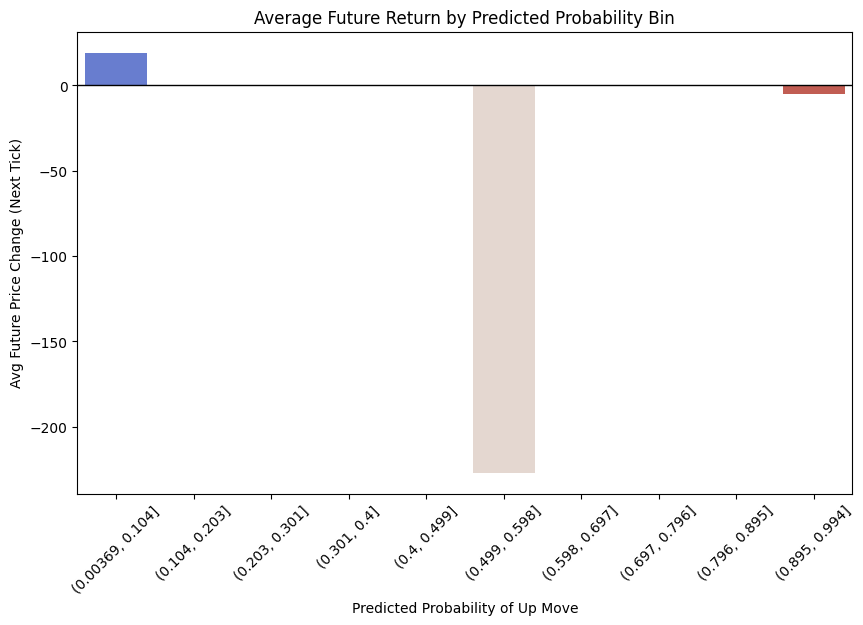

In [18]:
if not df.empty:
    # Look ahead 1 step (or N steps) to see if price moved in direction of probability
    # Prob > 0.5 implies UP prediction
    
    # Shift midprice change backwards to align "current prediction" with "future outcome"
    df['future_return'] = df['midprice'].diff().shift(-1)
    
    # Bin probabilities
    df['prob_bin'] = pd.cut(df['probability'], bins=10)
    
    # Fix pandas FutureWarning
    calibration = df.groupby('prob_bin', observed=False)[['future_return']].mean()
    
    plt.figure(figsize=(10, 6))
    # Fix seaborn FutureWarning
    sns.barplot(x=calibration.index, y=calibration['future_return'], hue=calibration.index, palette='coolwarm', legend=False)
    plt.xticks(rotation=45)
    plt.title('Average Future Return by Predicted Probability Bin')
    plt.ylabel('Avg Future Price Change (Next Tick)')
    plt.xlabel('Predicted Probability of Up Move')
    plt.axhline(0, color='black', linewidth=1)
    plt.show()

## 5. Interactive Dashboard
Zoom in on specific events using Plotly.

In [19]:
if not df.empty:
    # Create interactive plot with Plotly
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, 
                        vertical_spacing=0.05,
                        subplot_titles=('Price & Signals', 'Inventory', 'PnL'))

    # Price
    fig.add_trace(go.Scatter(x=df['datetime'], y=df['midprice'], name='Mid Price', line=dict(color='gray')), row=1, col=1)
    
    # Signals
    buy_signals = df[df['probability'] > 0.6]
    sell_signals = df[df['probability'] < 0.4]
    
    fig.add_trace(go.Scatter(x=buy_signals['datetime'], y=buy_signals['midprice'], 
                             mode='markers', name='Buy Signal', marker=dict(color='green', symbol='triangle-up')), row=1, col=1)
    fig.add_trace(go.Scatter(x=sell_signals['datetime'], y=sell_signals['midprice'], 
                             mode='markers', name='Sell Signal', marker=dict(color='red', symbol='triangle-down')), row=1, col=1)

    # Inventory
    fig.add_trace(go.Scatter(x=df['datetime'], y=df['inventory'], name='Inventory', line=dict(color='orange')), row=2, col=1)

    # PnL
    fig.add_trace(go.Scatter(x=df['datetime'], y=df['equity'], name='Equity', line=dict(color='blue')), row=3, col=1)

    fig.update_layout(height=800, title_text="HFT Strategy Dashboard", showlegend=True)
    fig.show()